# PROJECT:- AIR QUALITY 

### Importing python libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score


### Reading the CSV data

In [2]:

df=pd.read_csv('air_quality_health_impact_data.csv')
df

,RecordID,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
0,1,187.270059,295.853039,13.038560,6.639263,66.161150,54.624280,5.150335,84.424344,6.137755,7,5,1,97.244041,0.0
1,2,475.357153,246.254703,9.984497,16.318326,90.499523,169.621728,1.543378,46.851415,4.521422,10,2,0,100.000000,0.0
2,3,365.996971,84.443191,23.111340,96.317811,17.875850,9.006794,1.169483,17.806977,11.157384,13,3,0,100.000000,0.0
3,4,299.329242,21.020609,14.273403,81.234403,48.323616,93.161033,21.925276,99.473373,15.302500,8,8,1,100.000000,0.0
4,5,78.009320,16.987667,152.111623,121.235461,90.866167,241.795138,9.217517,24.906837,14.534733,9,0,1,95.182643,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5806,5807,171.112762,11.246387,197.984628,158.643107,17.743678,280.370909,37.359323,61.707640,4.097129,14,5,2,100.000000,4.0
5807,5808,490.691667,275.340762,55.774170,132.336871,29.334724,108.043492,34.532542,21.528555,6.682549,8,6,2,100.000000,3.0
5808,5809,314.841798,41.892699,184.708551,82.105823,68.334578,105.568503,22.975564,92.725625,2.889698,12,2,3,100.000000,1.0
5809,5810,208.080473,165.533785,199.177255,100.796385,87.586488,166.469537,36.090620,25.836286,10.722393,6,2,3,100.000000,4.0


### Visualisation of Data

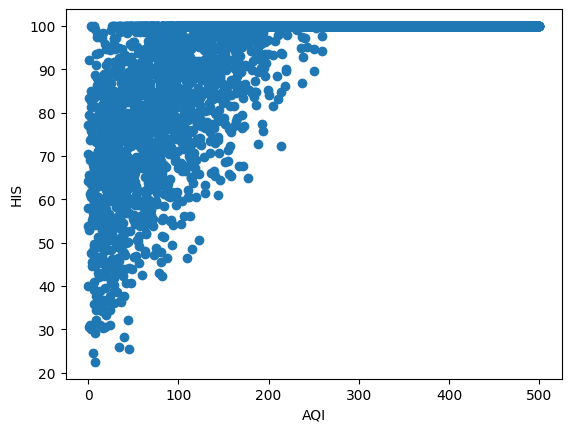

In [3]:
plt.scatter(df["AQI"],df["HealthImpactScore"])
plt.xlabel("AQI")
plt.ylabel("HIS")
plt.show()

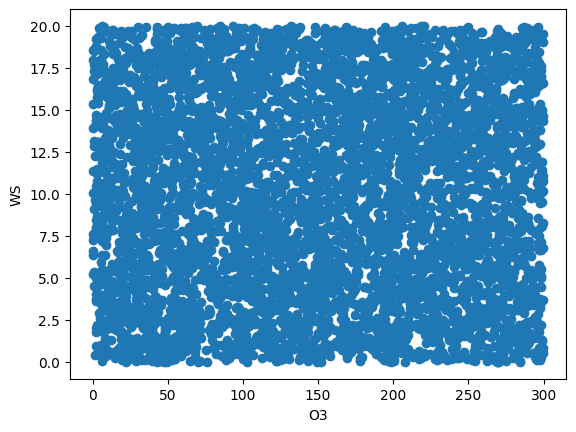

<Figure size 1500x500 with 0 Axes>

In [4]:
plt.scatter(df["O3"],df["WindSpeed"])
plt.xlabel("O3")
plt.ylabel("WS")
plt.figure(figsize=(15,5))
plt.show()

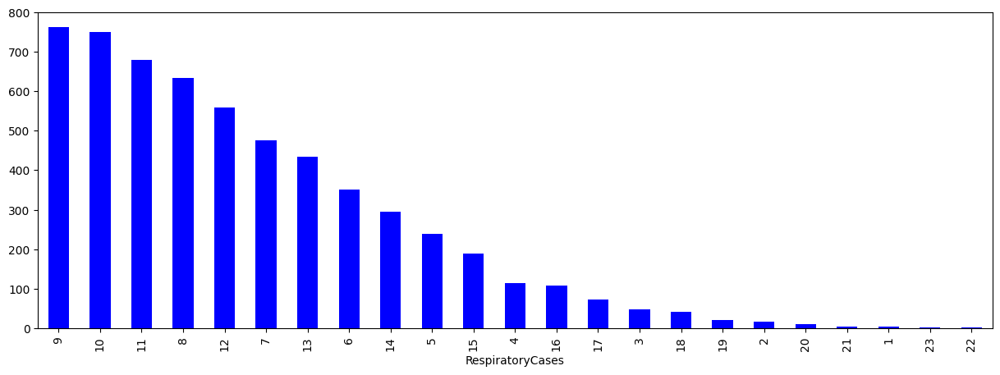

In [5]:
plt.figure(figsize=(15,5))

df["RespiratoryCases"].value_counts().plot.bar("o--",color = "b")
plt.show()


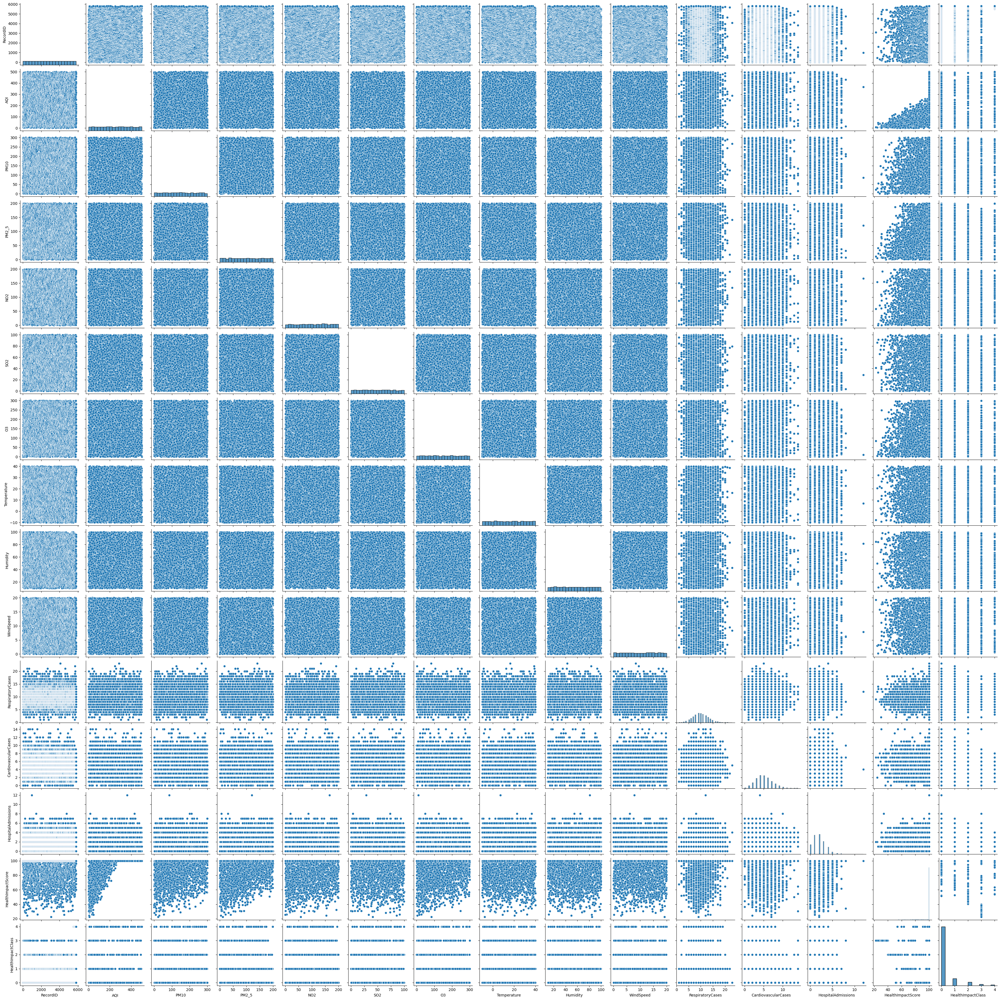

In [6]:
sns.pairplot(df)

### Data Information

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5811 entries, 0 to 5810
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   RecordID             5811 non-null   int64  
 1   AQI                  5811 non-null   float64
 2   PM10                 5811 non-null   float64
 3   PM2_5                5811 non-null   float64
 4   NO2                  5811 non-null   float64
 5   SO2                  5811 non-null   float64
 6   O3                   5811 non-null   float64
 7   Temperature          5811 non-null   float64
 8   Humidity             5811 non-null   float64
 9   WindSpeed            5811 non-null   float64
 10  RespiratoryCases     5811 non-null   int64  
 11  CardiovascularCases  5811 non-null   int64  
 12  HospitalAdmissions   5811 non-null   int64  
 13  HealthImpactScore    5811 non-null   float64
 14  HealthImpactClass    5811 non-null   float64
dtypes: float64(11), int64(4)
memory usage:

### checkng the null values

In [8]:
df.isnull().sum()

RecordID               0
AQI                    0
PM10                   0
PM2_5                  0
NO2                    0
SO2                    0
O3                     0
Temperature            0
Humidity               0
WindSpeed              0
RespiratoryCases       0
CardiovascularCases    0
HospitalAdmissions     0
HealthImpactScore      0
HealthImpactClass      0
dtype: int64

### checking the duplicacy in the data

In [9]:
df.duplicated().sum()

np.int64(0)

### checking outliers of the data 

In [10]:
def outlier(x):
    y=x.select_dtypes(include=[int,float])
    for i in y:
        sns.boxplot(x=df[i])
        plt.title(i)
        plt.show()

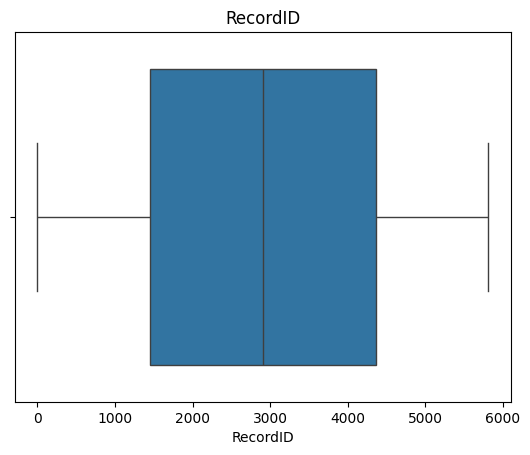

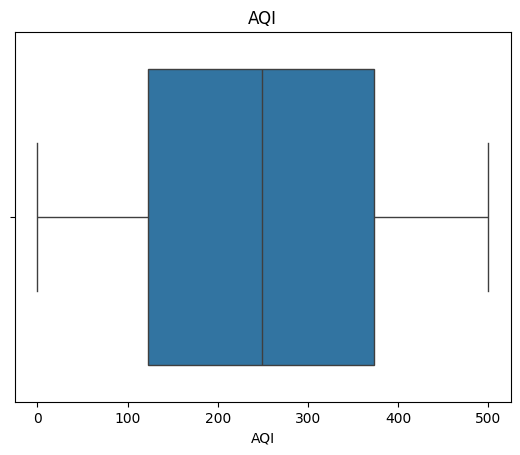

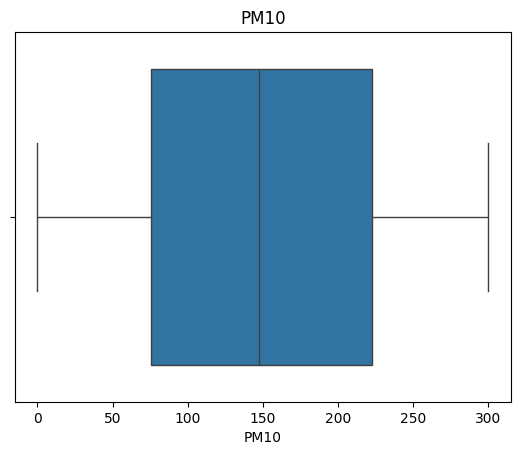

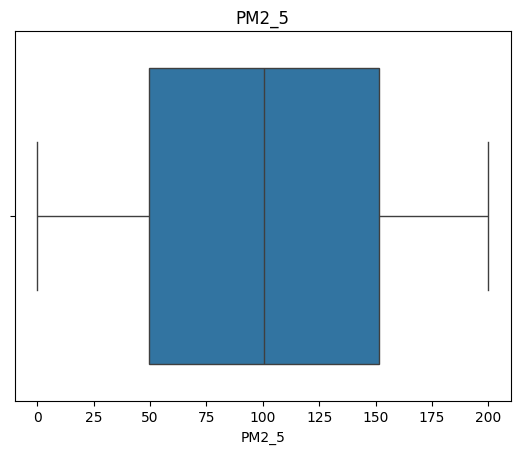

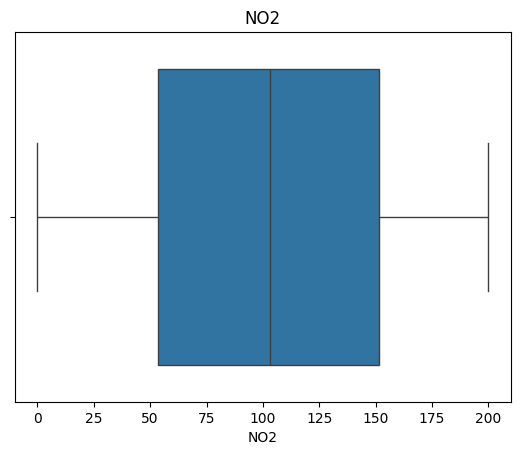

...

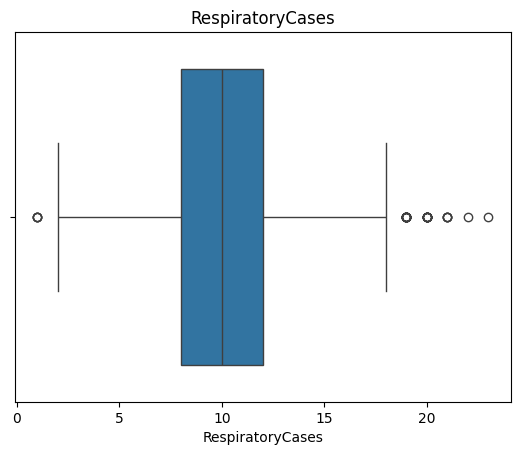

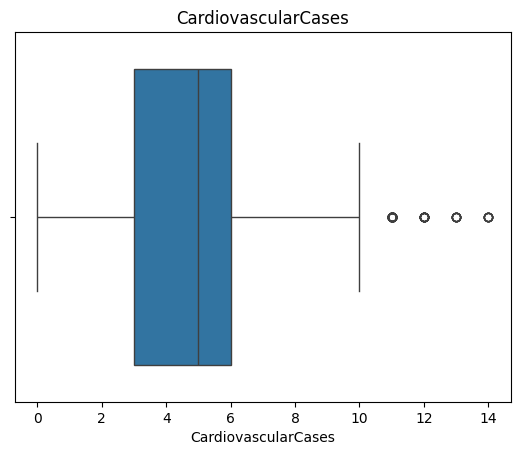

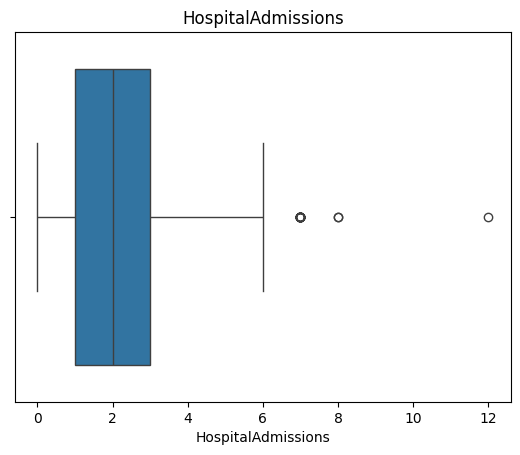

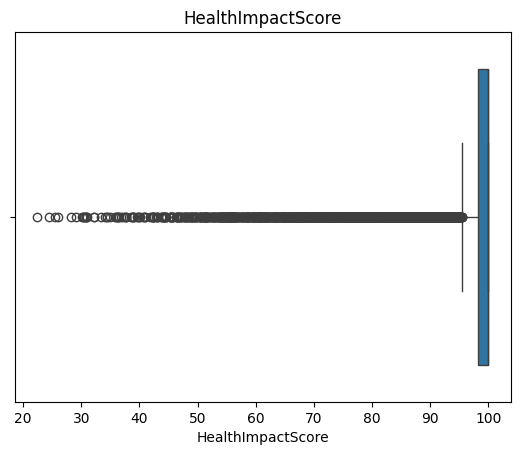

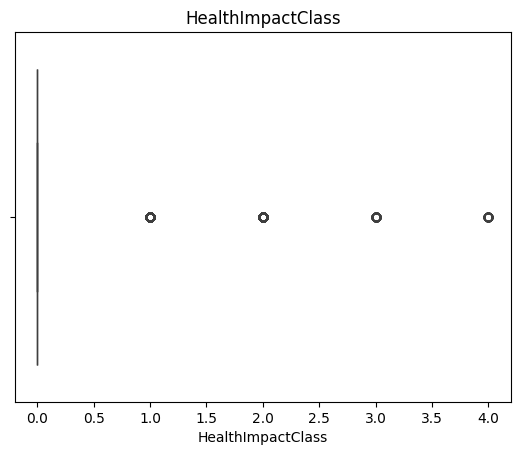

In [11]:
outlier(df)

### Finding lower and upper fence

In [12]:
def IQR(x):
    q1 = x.quantile(.25)
    q3  = x.quantile(.75)
    IQR = q3-q1
    lf=q1-(1.5*IQR)
    uf=q3+(1.5*IQR)
    print("lf-->",lf,"uf--->",uf)

### Function Call

In [13]:
IQR(df["RespiratoryCases"])
IQR(df["CardiovascularCases"])
IQR(df["HospitalAdmissions"])
IQR(df["HealthImpactScore"])
IQR(df["HealthImpactClass"])


lf--> 2.0 uf---> 18.0
lf--> -1.5 uf---> 10.5
lf--> -2.0 uf---> 6.0
lf--> 95.5076424542785 uf---> 102.6954145274329
lf--> 0.0 uf---> 0.0


### Treating Outliers

In [14]:

df["RespiratoryCases"]=np.where(df["RespiratoryCases"]> 18.0,18.0,df["RespiratoryCases"])
df["RespiratoryCases"]=np.where(df["RespiratoryCases"]< 2.0,2.0,df["RespiratoryCases"])
df["CardiovascularCases"]=np.where(df["CardiovascularCases"]> 0.5,0.5,df["CardiovascularCases"])
df["CardiovascularCases"]=np.where(df["CardiovascularCases"]< 0.5 ,0.5 ,df["CardiovascularCases"])
df["HospitalAdmissions"]=np.where(df["HospitalAdmissions"]> 6.0,6.0,df["HospitalAdmissions"])
df["HealthImpactScore"]=np.where(df["HealthImpactScore"]< 95.5076424542785,95.5076424542785,df["HealthImpactScore"])
df["HealthImpactClass"]=np.where(df["HealthImpactClass"]> 0.0,0.0,df["HealthImpactClass"])

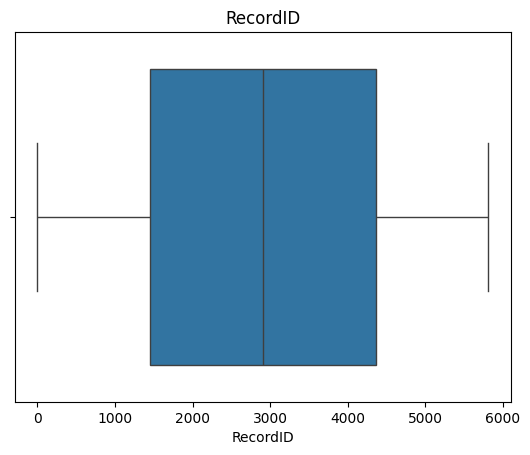

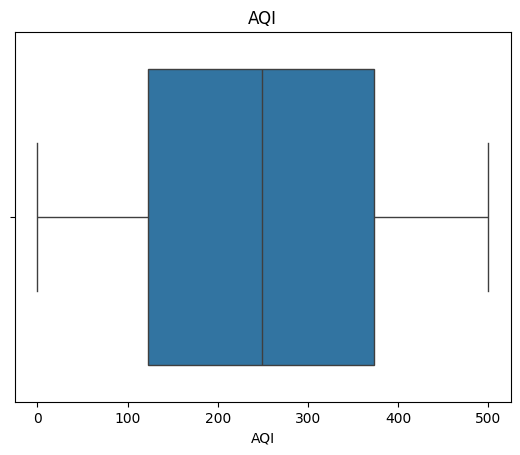

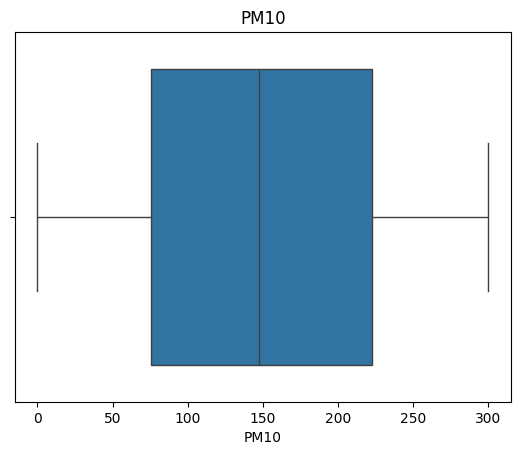

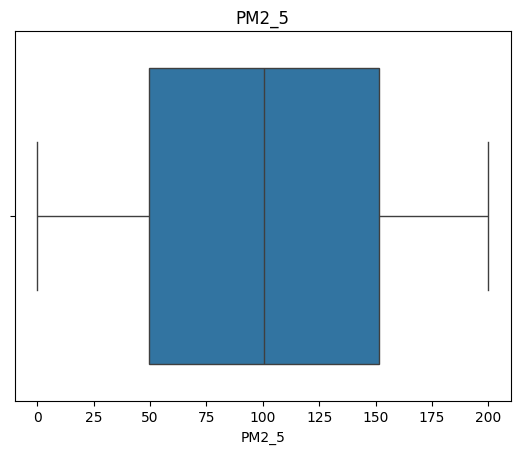

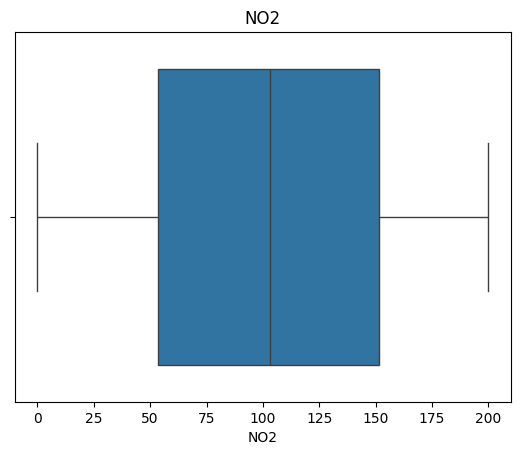

...

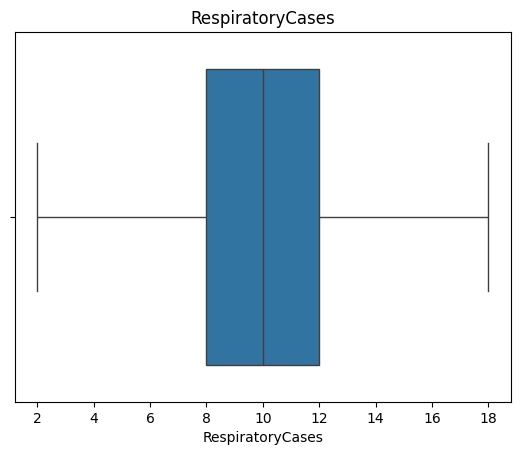

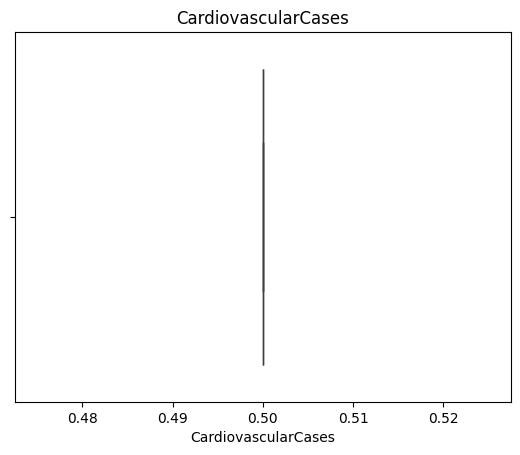

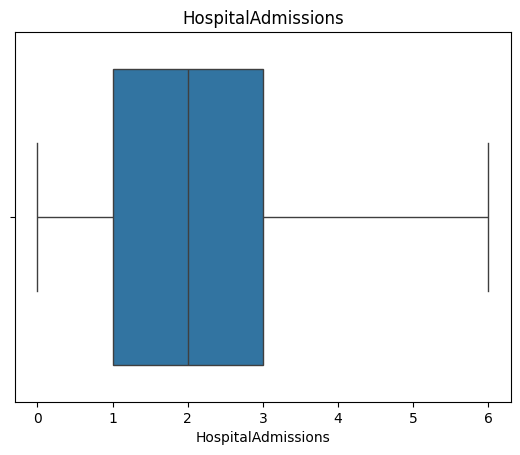

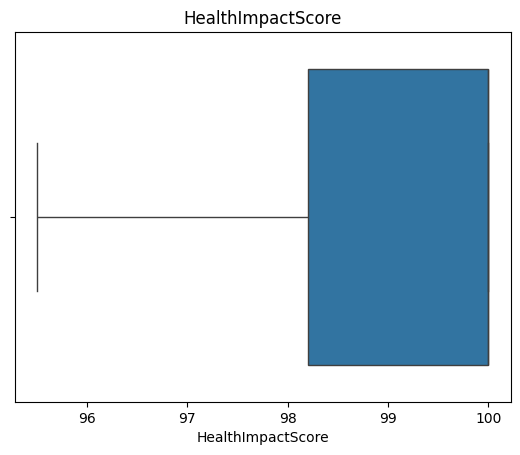

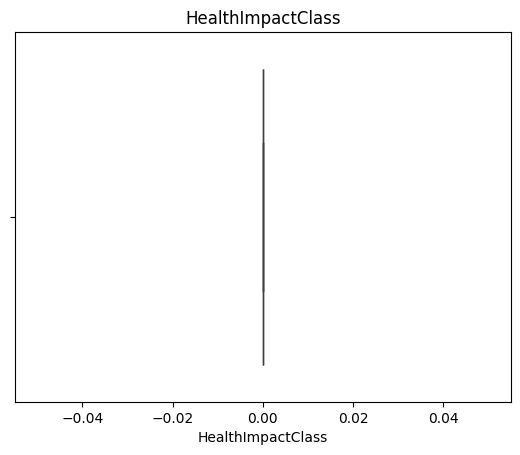

In [15]:
outlier(df)

### Checking Object datatypes

In [16]:
df.select_dtypes(object).columns

Index([], dtype='object')

### Defining the variables

In [17]:
y=df[["HealthImpactClass","HealthImpactScore"]]                    #target variable/dependent variable
x=df.drop(columns=["HealthImpactClass","HealthImpactScore", "RecordID"])       #independent variable

In [18]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

### Applying Decision Tree on the Data

###### Structure: Decision trees use a tree-like model of decisions. Each internal node represents a “test” on an attribute, each branch represents the outcome of the test, and each leaf node represents a class label (decision).
Types:
Classification Trees: Used when the target variable is categorical.
Regression Trees: Used when the target variable is continuous.


In [19]:
dt=DecisionTreeRegressor(random_state=42)
x_train

,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions
2495,246.162740,53.588663,12.663849,181.765443,85.223482,269.984662,6.483895,69.482701,11.732073,11.0,0.5,3.0
2451,483.208693,227.521102,186.271673,120.760154,19.331400,76.323992,-3.373430,97.806845,5.236308,9.0,0.5,1.0
5206,400.920084,279.379988,21.342994,23.708187,37.701986,5.572679,37.153150,40.961679,17.227403,8.0,0.5,3.0
3666,419.590197,264.075532,143.266205,127.574567,82.771119,148.100598,-6.102083,68.443069,0.481103,11.0,0.5,2.0
3362,346.179461,22.829997,152.160334,156.473159,58.614143,237.737998,33.022515,23.533900,11.909649,12.0,0.5,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3772,171.978843,40.182366,184.054240,18.103980,70.307202,138.847664,7.727584,41.333441,9.215293,4.0,0.5,0.0
5191,350.404209,177.372872,74.586426,13.856980,96.539612,192.885342,-3.943574,22.951993,1.003598,10.0,0.5,2.0
5226,291.653624,76.388060,65.545391,91.379814,50.851903,20.664820,0.969888,57.142306,10.622026,10.0,0.5,3.0
5390,69.725118,116.887805,121.859488,149.717145,13.423333,264.048108,-0.635148,38.152092,8.483861,4.0,0.5,1.0


### Fitting the data into the decision tree

In [20]:
dt.fit(x_train,y_train)

DecisionTreeRegressor(random_state=42)

In [21]:
y_train

,HealthImpactClass,HealthImpactScore
2495,0.0,100.00000
2451,0.0,100.00000
5206,0.0,100.00000
3666,0.0,100.00000
3362,0.0,100.00000
...,...,...
3772,0.0,100.00000
5191,0.0,100.00000
5226,0.0,100.00000
5390,0.0,98.63347


### Test and Train Accuracy in Decision Tree

In [22]:
print("train accuracy",dt.score(x_train,y_train))
print("test accuracy",dt.score(x_test,y_test))

train accuracy 1.0
test accuracy 0.8545062936358708


In [23]:
dt=DecisionTreeRegressor(max_depth=6,min_samples_leaf=20,min_samples_split=3,random_state=42)
dt.fit(x_train,y_train)

DecisionTreeRegressor(max_depth=6, min_samples_leaf=20, min_samples_split=3,
                      random_state=42)

In [24]:
print("train accuracy",dt.score(x_train,y_train))
print("test accuracy",dt.score(x_test,y_test))

train accuracy 0.931170405354997
test accuracy 0.8848150160261565


In [25]:
from sklearn.tree import export_text

In [26]:
rules = export_text(dt,feature_names=x_train.columns.to_list())

In [27]:
print(rules)

|--- AQI <= 125.74
|   |--- AQI <= 88.65
|   |   |--- PM2_5 <= 131.64
|   |   |   |--- O3 <= 253.87
|   |   |   |   |--- NO2 <= 190.22
|   |   |   |   |   |--- PM10 <= 288.02
|   |   |   |   |   |   |--- value: [0.00, 95.53]
|   |   |   |   |   |--- PM10 >  288.02
|   |   |   |   |   |   |--- value: [0.00, 95.96]
|   |   |   |   |--- NO2 >  190.22
|   |   |   |   |   |--- value: [0.00, 96.05]
|   |   |   |--- O3 >  253.87
|   |   |   |   |--- AQI <= 63.50
|   |   |   |   |   |--- PM2_5 <= 84.84
|   |   |   |   |   |   |--- value: [0.00, 95.51]
|   |   |   |   |   |--- PM2_5 >  84.84
|   |   |   |   |   |   |--- value: [0.00, 96.15]
|   |   |   |   |--- AQI >  63.50
|   |   |   |   |   |--- value: [0.00, 97.22]
|   |   |--- PM2_5 >  131.64
|   |   |   |--- PM10 <= 187.59
|   |   |   |   |--- O3 <= 188.78
|   |   |   |   |   |--- AQI <= 68.65
|   |   |   |   |   |   |--- value: [0.00, 95.52]
|   |   |   |   |   |--- AQI >  68.65
|   |   |   |   |   |   |--- value: [0.00, 96.18]
|   |   |

### Applying Random Forest on the data sets

##### Random Forest is an ensemble learning method that combines multiple decision trees to improve predictive accuracy and control overfitting.

In [28]:
rm=RandomForestRegressor()

In [29]:
rm.fit(x_train,y_train)

RandomForestRegressor()

### Test and Train Accuracy in Random Forest

In [30]:
print("train accuracy",rm.score(x_train,y_train))
print("test accuracy",rm.score(x_test,y_test))

train accuracy 0.9909032900513128
test accuracy 0.9380546362405097


In [31]:
rm=RandomForestRegressor(n_estimators=100,criterion='squared_error',max_depth=8,min_samples_split=3,min_samples_leaf=1,random_state=42)
rm.fit(x_train,y_train)

RandomForestRegressor(max_depth=8, min_samples_split=3, random_state=42)

In [32]:
print("train accuracy",rm.score(x_train,y_train))
print("test accuracy",rm.score(x_test,y_test))

train accuracy 0.9862253959908703
test accuracy 0.9368124325560825


In [39]:
import pickle

# Assuming 'model' is the trained model from your notebook
with open('rm.pkl', 'wb') as f:
    pickle.dump(rm, f)

### Apply Logistic Regression


##### Logistic regression is used for binary classification tasks, predicting the probability that an instance belongs to one of two classes (e.g., yes/no, 0/1, true/false).

In [34]:
df['HealthImpactScore'] = pd.to_numeric(df['HealthImpactScore'], errors='coerce')

threshold_high = df['HealthImpactScore'].quantile(0.75)
threshold_low = df['HealthImpactScore'].quantile(0.25)

df['HealthImpactCategory'] = pd.cut(df['HealthImpactScore'],
                                    bins=[-float('inf'), threshold_low, threshold_high, float('inf')],
                                    labels=['Low', 'Medium', 'High'])

### Defining the variables in the Logistic Regression

In [35]:
y1 = df[['HealthImpactCategory']]                                        #target variable/dependent variable
x1 = df.drop(columns=['HealthImpactScore', 'HealthImpactCategory',  'RecordID'])      #independent variable

In [36]:
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,test_size=0.2,random_state=42)

### Fitting the Variables

In [37]:
log = LogisticRegression()
log.fit(x1_train, y1_train)

LogisticRegression()

### Test and Train Accuracy in Logistic regression


In [38]:
print("train accuracy",log.score(x1_train,y1_train))
print("test accuracy",log.score(x1_test,y1_test))

train accuracy 0.9236230636833046
test accuracy 0.9071367153912295


#### GROUP 4


##### MEMBERS:-
          

##### 1)Abdulla Bin Sohail

   ##### 2)Ajay Veer Vikram Verma

##### 3)Ashish Gautam

# THANK YOU!